In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
import numpy as np
import os
import time
import random
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import pickle
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
import matplotlib.pyplot as plt
if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'

import pickle

seed =1
torch.manual_seed(seed)


from torchvision import transforms, utils
import torchvision.models as models
# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

from multi_center_tools.multi_tools import axial_sampling,open_pickle, load_TCGA_arrays,select_df
from multi_center_tools.IDH_tools import TCGA_Dataset_With_sampling_from_array, JC_Dataset_With_sampling_from_array,TCGAToTensor, JCToTensor
#from multi_center_tools.Cycle_tool import get_converted_arrys
import copy
import copy
from torchmetrics import F1Score
f1ig0 = F1Score(num_classes=2, average='macro', ignore_index=0)
f1ig1 = F1Score(num_classes=2, average='macro', ignore_index=1)
from sklearn.model_selection import KFold

import torchvision
from PIL import Image
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
import cv2

# tools

In [2]:
def reverse_0_1(label):
    if label ==torch.tensor(0):
        return torch.tensor(1)
    else:
        return torch.tensor(0)
    
def get_heatmaps(model, target_layers, tensor, label):
    tensor = tensor.unsqueeze(0)
    targets =[ClassifierOutputTarget(label)]
    with GradCAMPlusPlus(model=model, target_layers=target_layers,
            use_cuda=False) as cam:
        grayscale_cam = cam(input_tensor=tensor, targets=targets)
    heatmap= cv2.applyColorMap(np.uint8(255 * grayscale_cam[0,:]), cv2.COLORMAP_JET)
    rgb_heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    
    #Fake label
    f_targets=[ClassifierOutputTarget(reverse_0_1(label))]
    with GradCAMPlusPlus(model=model, target_layers=target_layers,
            use_cuda=False) as cam:
        f_grayscale_cam = cam(input_tensor=tensor, targets=f_targets)
    f_heatmap= cv2.applyColorMap(np.uint8(255 * f_grayscale_cam[0,:]), cv2.COLORMAP_JET)
    f_rgb_heatmap = cv2.cvtColor(f_heatmap, cv2.COLOR_BGR2RGB)
    
    return rgb_heatmap, f_rgb_heatmap

IDH_dict={0:'IDH wild type', 1:'IDH 1 or 2 mutation'}

In [3]:
base = '/programing/python/HvsAI'

#fold0 = base + '/Grad_CAM/localModel/TCGA_6/epoch=53-step=215.ckpt'
#fold0 = base + '/Grad_CAM/localModel/JC_lw_3/epoch=65-step=527.ckpt'
#fold4 = base +'/Grad_CAM/localModel/TCGA_list1/epoch=83-step=335.ckpt'
#fold4 = base +'/programing/python/HvsAI/Grad_CAM/localModel/TCGA_list1/epoch=83-step=335.ckpt'

fold8 = base + '/Grad_CAM/localModel/TCGA_list1_w3/epoch=50-step=510.ckpt'
folds_models = [fold8]

In [4]:
img_loc = '/local_data/array/kino_scaling/JC_array/'
TCGA_img_loc = '/local_data/array/kino_scaling/FR_BraTS2019_array/'
dict_path = '/programing/python/HvsAI/data/official_models/resnet34-333f7ec4.pth'


Z_score = False
SZ = True
Double = False
inst = None

Batch_size = 1
weights = torch.tensor([1.0, 1.0]).to(device)
epoch = 100
lr = 5e-3

fold = 0
max_lr=lr
#total_steps=(1 + len(train_pd )//Batch_size )  * epoch
#total_steps=int(1 + (len(train_pd )*0.8)//Batch_size )  * epoch
#print(total_steps)

save_name = 'TCGA5fold_fold' + str(fold)
print(save_name)
pretrained_filename = folds_models[fold]

# Path to the folder where the pretrained models are saved
CHECKPOINT_PATH = "./saved_models/" + save_name
if not os.path.exists(CHECKPOINT_PATH):
    os.makedirs(CHECKPOINT_PATH)

TCGA5fold_fold0


In [5]:
TCGA_csv_loc = '/programing/python/vit_experiment/label_data/TCGA_training_nondu.csv'
TCGA_df =pd.read_csv(TCGA_csv_loc)

In [6]:
csv_loc = '/programing/python/vit_experiment/label_data/All_japan.csv'
df =pd.read_csv(csv_loc)
TCGA_predicted= pd.read_csv(
'/programing/python/HvsAI/Lr_ken/TCGA/Predict/BS32_10folds/normal_list1_width3/data/TCGA_predicted.csv')
JC_train_predicted =  pd.read_csv(
'/programing/python/HvsAI/Lr_ken/TCGA/Predict/BS32_10folds/normal_list1_width3/data/JC_train_predicted.csv')
JC_test_predicted =  pd.read_csv(
'/programing/python/HvsAI/Lr_ken/TCGA/Predict/BS32_10folds/normal_list1_width3/data/JC_test_predicted.csv')

In [7]:
JC_train_pd = pd.merge(df,JC_train_predicted, on='ID')
JC_test_pd = pd.merge(df, JC_test_predicted, on='ID')

TCGA_predicted = TCGA_predicted.rename(columns={'ID':'BraTS_2019_subject_ID'})
TCGA_pd = pd.merge(TCGA_df, TCGA_predicted, on='BraTS_2019_subject_ID')

In [8]:
JC_train_pd['ID'] = [str(i) for i in JC_train_pd['ID']]
JC_test_pd['ID'] = [str(i) for i in JC_test_pd['ID']]

#reset index
JC_train_pd =JC_train_pd.reset_index()
JC_test_pd = JC_test_pd.reset_index()

In [9]:
TCGA = TCGA_Dataset_With_sampling_from_array(TCGA_pd, TCGA_img_loc,axial_sampling,
                                                z_score=Z_score,sz=SZ, double=Double,inst=inst,
                                                transform = TCGAToTensor())

JC_test = JC_Dataset_With_sampling_from_array(JC_test_pd, img_loc,axial_sampling,transform = JCToTensor(),
                                              z_score=Z_score,inst=inst, sz=SZ,
                                              double=Double)
JC_train = JC_Dataset_With_sampling_from_array(JC_train_pd, img_loc,axial_sampling,transform = JCToTensor(),
                                              z_score=Z_score,inst=inst, sz=SZ,
                                              double=Double)

In [10]:
TCGA_loader = torch.utils.data.DataLoader(TCGA_pd, batch_size=Batch_size, shuffle=False, num_workers=0)
JC_train_loader = torch.utils.data.DataLoader(JC_train, batch_size=Batch_size, shuffle = False, num_workers=0)
JC_test_loader = torch.utils.data.DataLoader(JC_test, batch_size=Batch_size, shuffle = False, num_workers=0)

# Moodel

In [11]:
offcial34 = models.resnet34()
#dict_path = '/programing/python/second_MCR/Ken_CHang/official_models/resnet34-333f7ec4.pth'
#dict_path = '../official_models/resnet34-333f7ec4.pth'
offcial34.load_state_dict(torch.load(dict_path))

class Identity(nn.Module):
    def __init__(self):
        super(Identity, self).__init__()
        
    def forward(self, x):
        return x

In [12]:
offcial34.conv1 = nn.Conv2d(12, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
offcial34.fc = nn.Linear(in_features=512, out_features=2, bias=True)
net = offcial34

In [13]:
import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint
act_fn_by_name = {
    "tann":nn.Tanh,
    "relu":nn.ReLU,
    "leakyrelu":nn.LeakyReLU,
    "gelu":nn.GELU
}

In [14]:
# Setting the seed
pl.seed_everything(42)

print(pl.__version__)

Global seed set to 42


1.7.7


In [15]:
class JCModule(pl.LightningModule):
    
    def __init__(self, model, optimizer_name, optimizer_hparams):
        """
        Inputs:
              optimizer_name - Name of the optimzer to use. Currently supported: Adam, SGD
              optimizer_hparams - Hyperparameters for the optimizer, as dictiornay. This includes learning rate weight decay, etc.
        """
        super().__init__()
        #Exports the hyperparameters to YAML file, and create "self.hparams" namespace
        self.save_hyperparameters()
        # Create model
        self.model = model
        # Create loss module
        self.loss_module = nn.CrossEntropyLoss()
        #Example input for visualizing the graph in Tensorboard
        self.example_input_array = torch.zeros((1,12,176,192), dtype=torch.float32)
        
    def forward(self, imgs):
        # Forward function that is run when visualizing the graph
        return self.model(imgs)
    
    def configure_optimizers(self):
        # We will support Adam or SGD as optimizers.
        if self.hparams.optimizer_name == "Adam":
            #AdamW is Adam with a correct implementation of weight decay
            optimizer = optim.AdamW(
            self.parameters(), **self.hparams.optimizer_hparams)
        elif self.hparams.optimizer_name == "SGD":
            optimizer = optim.SGD(self.parameters(),**self.hparams.optimizer_hparams)
        else:
            assert False, f"Unknown optimizer: \"{self.hparams.optimizer_name}\""
        # We will redudce the learning rate by 0.1 after 100 and 150 epochs
        scheduler = optim.lr_scheduler.OneCycleLR(optimizer, max_lr=5e-3,total_steps=600)
        return [optimizer], [scheduler]
        
    def training_step(self, batch, batcfh_idx):
        # "batch" is the output of the training data loader.
        imgs, labels = batch
        labels = labels[3]
        preds = self.model(imgs)
        loss = self.loss_module(preds, labels)
        acc = (preds.argmax(dim =-1) == labels).float().mean()
        f1score = f1ig0 (preds, labels)
        f1scoreR = f1ig1 (preds, labels)
        #Logs the accuracy per epoch to tensorboard (weighted average over batches)
        self.log('train_acc',acc,on_step=False, on_epoch = True)
        self.log('train_loss', loss)
        self.log('train_F1', f1score)
        self.log('train_F1R', f1scoreR)
        return loss # Return tensor to call ".backward" on
    
    def validation_step(self, batch, batch_idx):
        imgs, labels = batch
        labels = labels[3]
        preds = self.model(imgs).argmax(dim =-1)
        acc = (labels == preds).float().mean()
        f1score = f1ig0 (preds, labels)
        f1scoreR = f1ig1 (preds, labels)
        # By default logs it per epoch (weighted average over batches)
        self.log('val_acc', acc)
        self.log('val_F1', f1score)
        self.log('val_F1R', f1scoreR)
        
    def test_step(self, batch, batch_idx):
        imgs, labels = batch
        labels = labels[3]
        preds = self.model(imgs).argmax(dim =-1)
        acc = (labels == preds).float().mean()
        f1score = f1ig0 (preds, labels)
        f1scoreR = f1ig1 (preds, labels)
        # By the default logs it per epoch(weight average over batches), and return it afterwards
        self.log('test_acc', acc)
        self.log('test_F1', f1score)
        self.log('test_F1R', f1scoreR)
        
    def predict_step(self, batch, batch_idx):
        imgs, labels = batch
        preds = self.model(imgs).argmax(dim =-1)
        prob = torch.sigmoid(self.model(imgs))
        value, _ = torch.max(prob,1)
        return preds, value

In [16]:
loaed_module = JCModule.load_from_checkpoint(folds_models[0])
model = loaed_module.model
#features_cov = loaed_module.model.copy()
#model.eval()
#features_cov.fc = Identity()
#features_cov.avgpool = Identity()
target_layers = [model.layer4[-1]]

In [17]:
target_list=[2001,3021, 2058,2053]
JC_test_predicted.query('ID in @target_list')

,ID,Predicted_label_fold0,Proba_fold0,Predicted_label_fold1,Proba_fold1,Predicted_label_fold2,Proba_fold2,Predicted_label_fold3,Proba_fold3,Predicted_label_fold4,...,Predicted_label_fold5,Proba_fold5,Predicted_label_fold6,Proba_fold6,Predicted_label_fold7,Proba_fold7,Predicted_label_fold8,Proba_fold8,Predicted_label_fold9,Proba_fold9
0,2001,0,0.991345,0,0.675443,0,0.999992,0,0.987871,0,...,0,0.999924,0,0.989540,0,0.977318,0,0.999977,0,0.992480
10,2053,0,0.881807,0,0.511233,0,0.997445,0,0.725309,0,...,0,0.999937,0,0.708066,0,0.999425,0,0.999983,0,0.984803
12,2058,1,0.702422,0,0.634328,0,0.833191,0,0.833149,0,...,0,0.590019,1,0.515456,0,0.998306,1,0.925442,0,0.960002
20,3021,1,0.965046,0,0.657839,1,0.996927,0,0.660898,1,...,0,0.802154,1,0.534425,1,0.999869,1,0.913954,1,0.637433


In [18]:
IDH_dict = {0:'Wild type', 1:'IDH mut'}

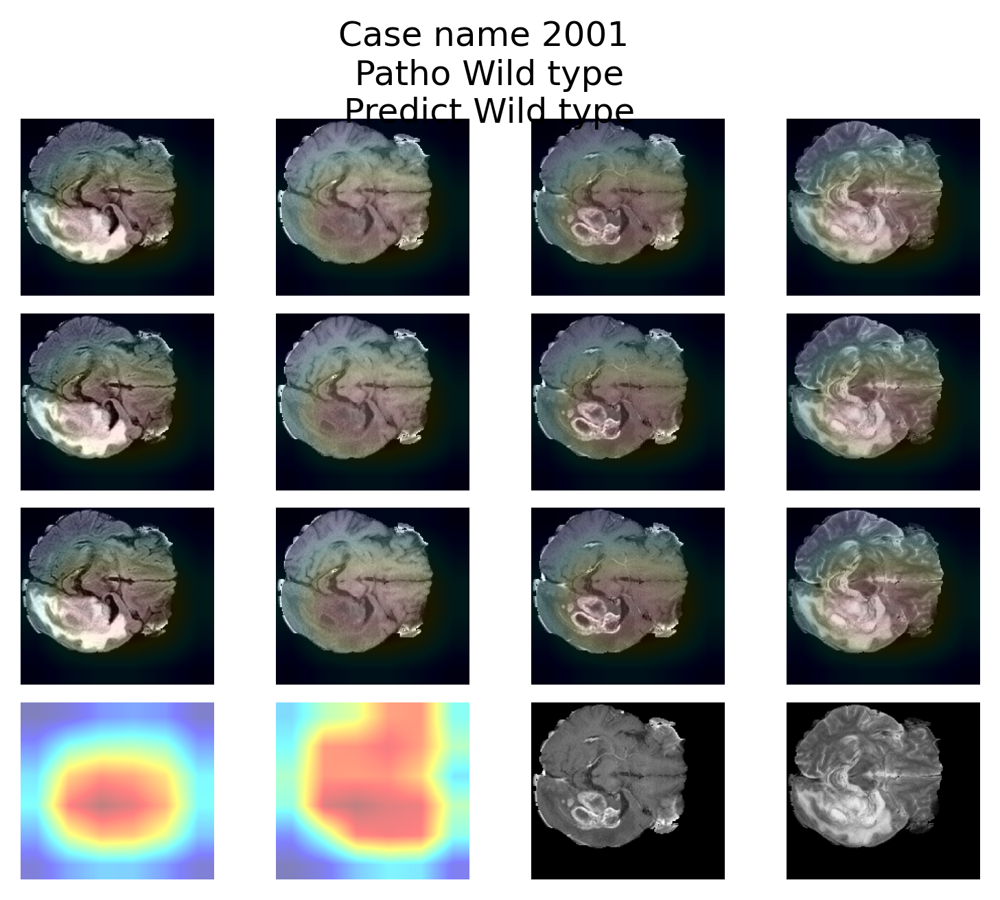

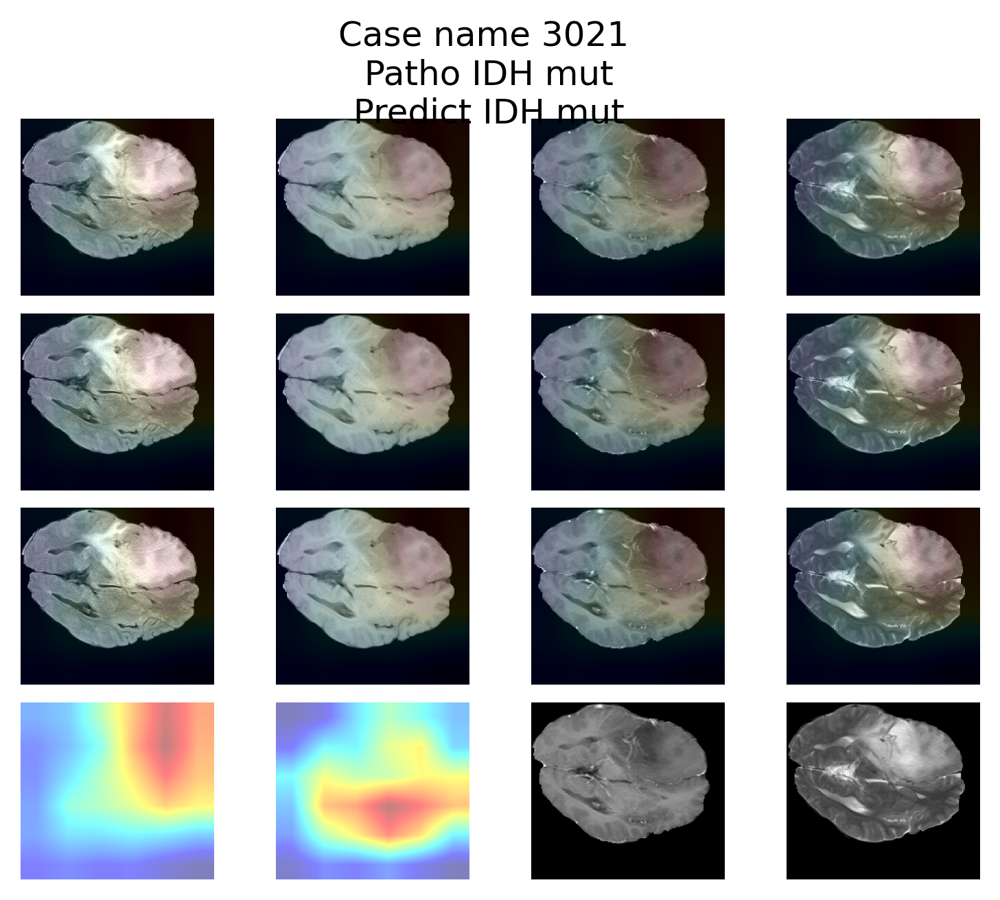

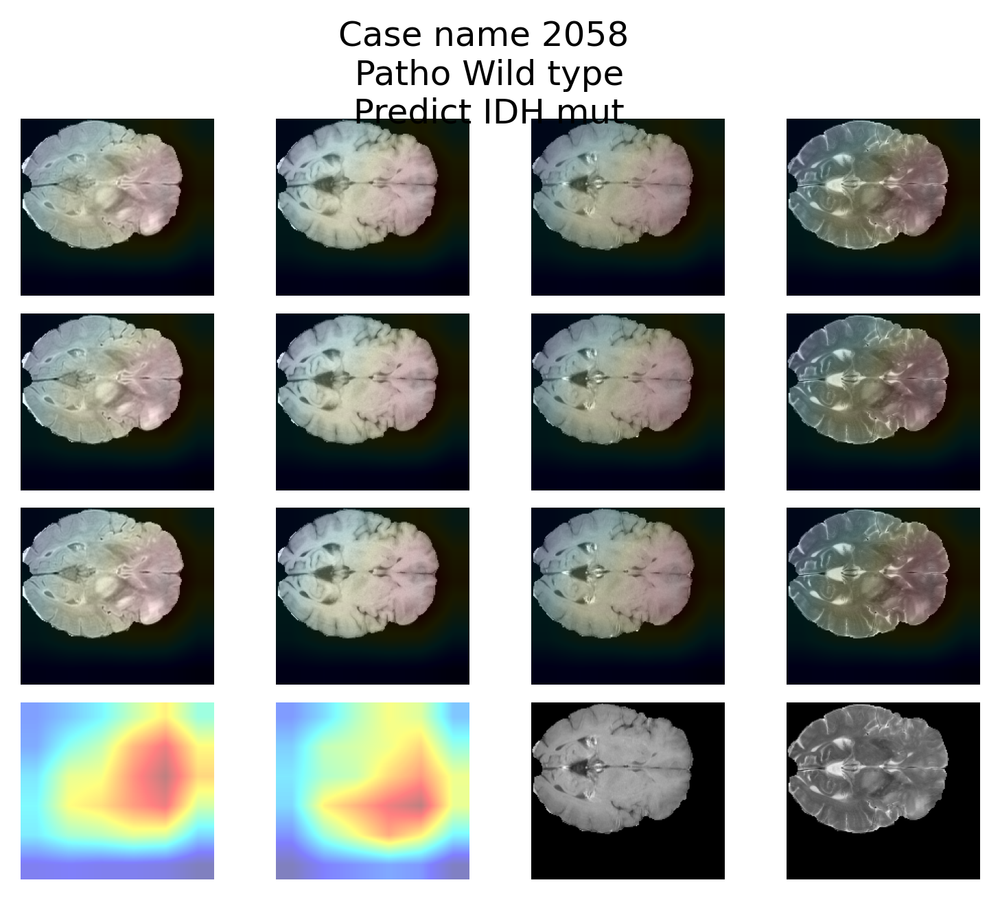

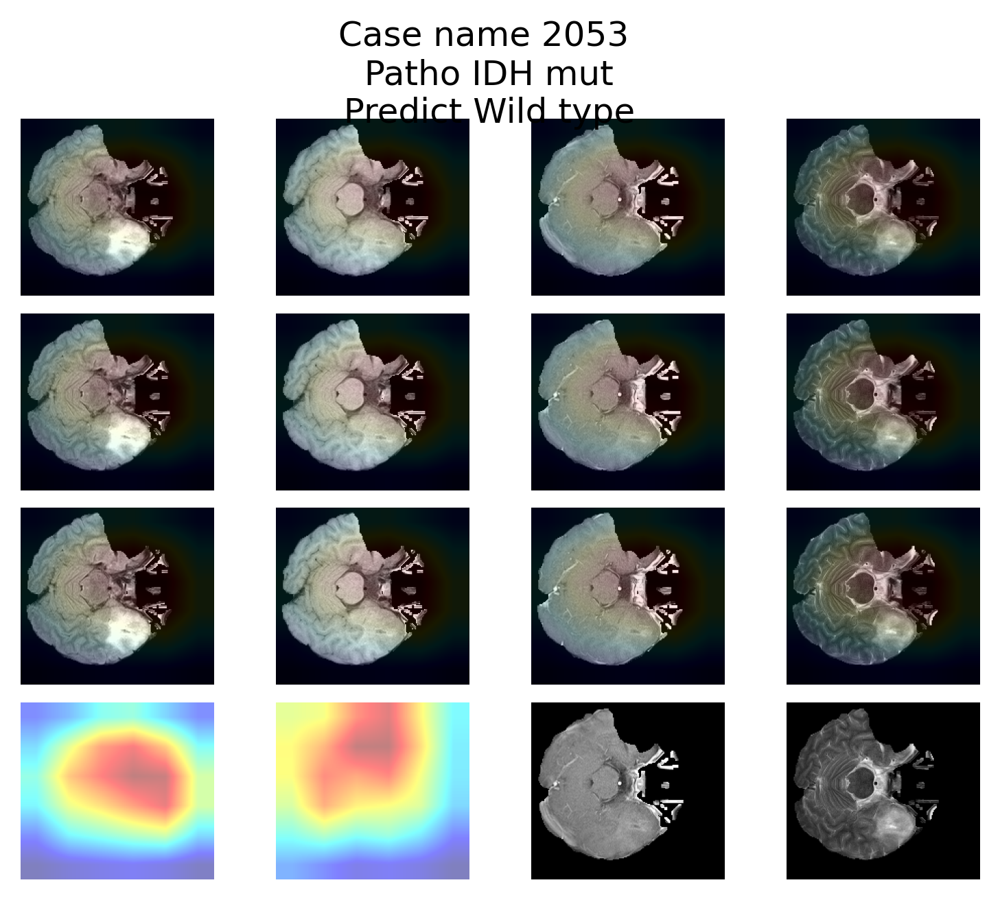

In [19]:
for n in [0,20,12,10]:
    label = JC_test_pd['Predicted_label_fold8'][n]
    true = int(JC_test[n][1][3])
    true_mask, fake_mask = get_heatmaps(model, target_layers, JC_test[n][0], label)
    T1CE_img = JC_test[n][0][2].to('cpu').detach().numpy().copy()
    T2_img = JC_test[n][0][3].to('cpu').detach().numpy().copy()
    fig = plt.figure(dpi=300)
    for i in range(12):
        img_numpy = JC_test[n][0][i].to('cpu').detach().numpy().copy()
        ax = fig.add_subplot(4,4,i+1)
        ax.imshow(img_numpy, cmap='gray')
        ax.imshow(true_mask, alpha=0.1)
        ax.axis('off')
        plt.subplots_adjust(
                        wspace=0, 
                        hspace=0.1)
    
    ax = fig.add_subplot(4,4,13)
    ax.imshow(true_mask, alpha=0.5)
    ax.axis('off')
    plt.subplots_adjust(wspace=0, 
                        hspace=0.1)
    
    ax = fig.add_subplot(4,4,14)
    ax.imshow(fake_mask, alpha=0.5)
    ax.axis('off')
    plt.subplots_adjust(wspace=0, 
                        hspace=0.1)
    
    ax = fig.add_subplot(4,4,15)
    ax.imshow(T1CE_img, cmap='gray')
    ax.axis('off')
    plt.subplots_adjust(wspace=0, 
                        hspace=0.1)
    
    ax = fig.add_subplot(4,4,16)
    ax.imshow(T2_img, cmap='gray')
    ax.axis('off')
    plt.subplots_adjust(wspace=0, 
                        hspace=0.1)
    fig.suptitle('Case name %s\n Patho %s\n Predict %s'
                 %(JC_test_pd['ID'][n], IDH_dict[true], IDH_dict[label]))

In [20]:
target_list=[31028,31078, 30037,31074]
JC_test_predicted.query('ID in @target_list')

,ID,Predicted_label_fold0,Proba_fold0,Predicted_label_fold1,Proba_fold1,Predicted_label_fold2,Proba_fold2,Predicted_label_fold3,Proba_fold3,Predicted_label_fold4,...,Predicted_label_fold5,Proba_fold5,Predicted_label_fold6,Proba_fold6,Predicted_label_fold7,Proba_fold7,Predicted_label_fold8,Proba_fold8,Predicted_label_fold9,Proba_fold9
206,30037,1,0.891314,0,0.630077,1,0.940480,1,0.540346,0,...,1,0.997191,1,0.750689,1,0.999439,1,0.869342,1,0.979940
246,31028,0,0.997919,0,0.735832,0,0.995561,0,0.996570,0,...,0,0.999119,0,0.737349,0,0.998668,0,0.999952,0,0.948673
265,31074,0,0.947641,0,0.786587,0,0.998195,0,0.984223,0,...,0,0.992048,0,0.992664,0,0.974186,0,0.999916,0,0.996535
267,31078,0,0.716930,1,0.500740,1,0.999731,1,0.891478,0,...,1,0.995873,1,0.554499,1,1.000000,1,0.992125,0,0.959559


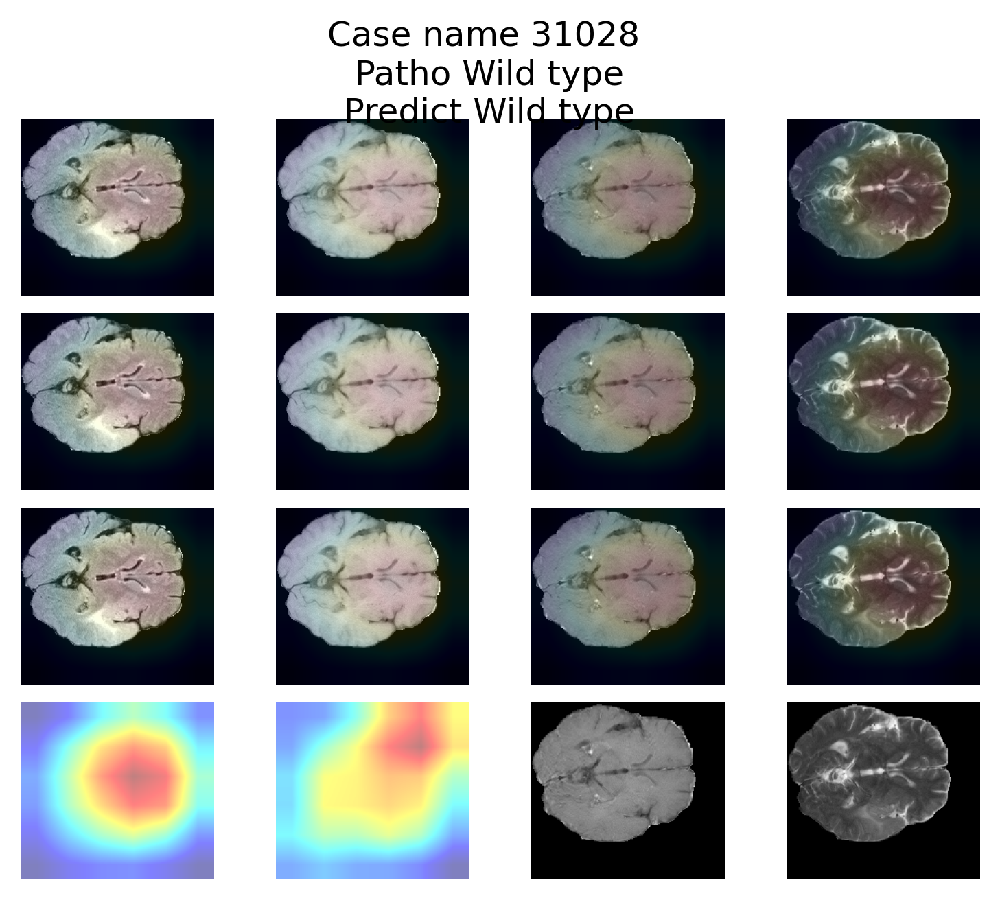

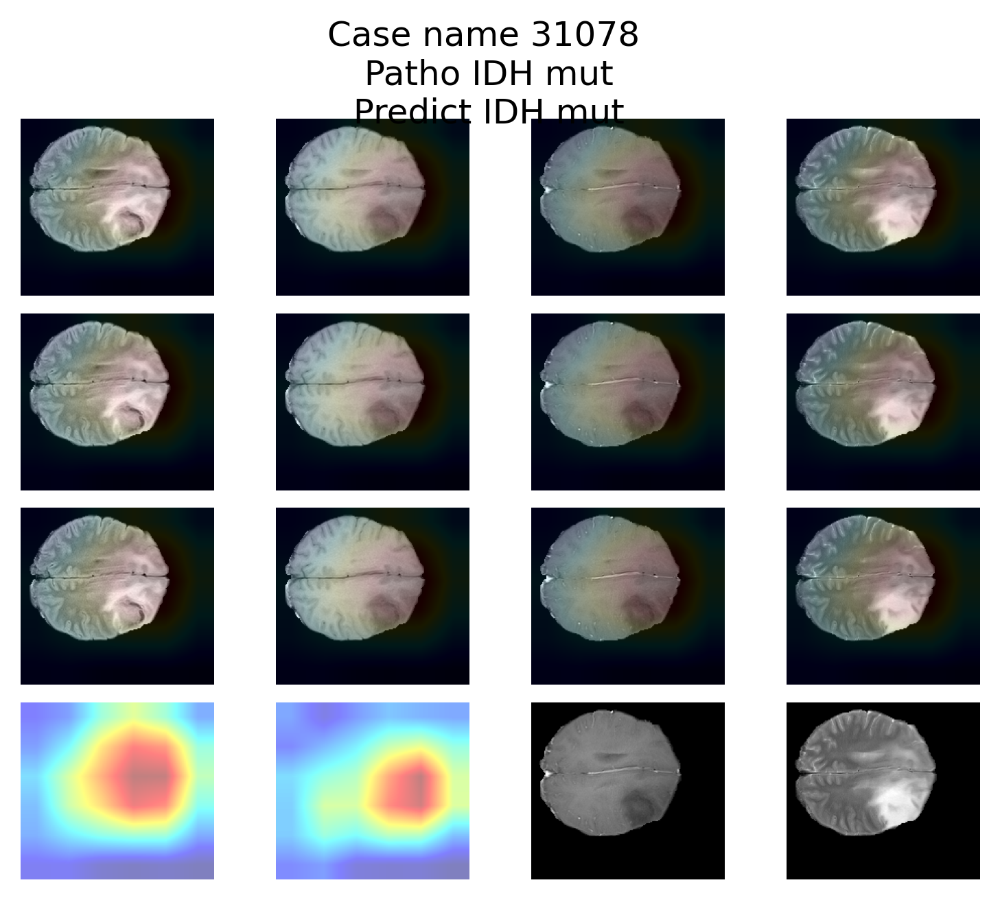

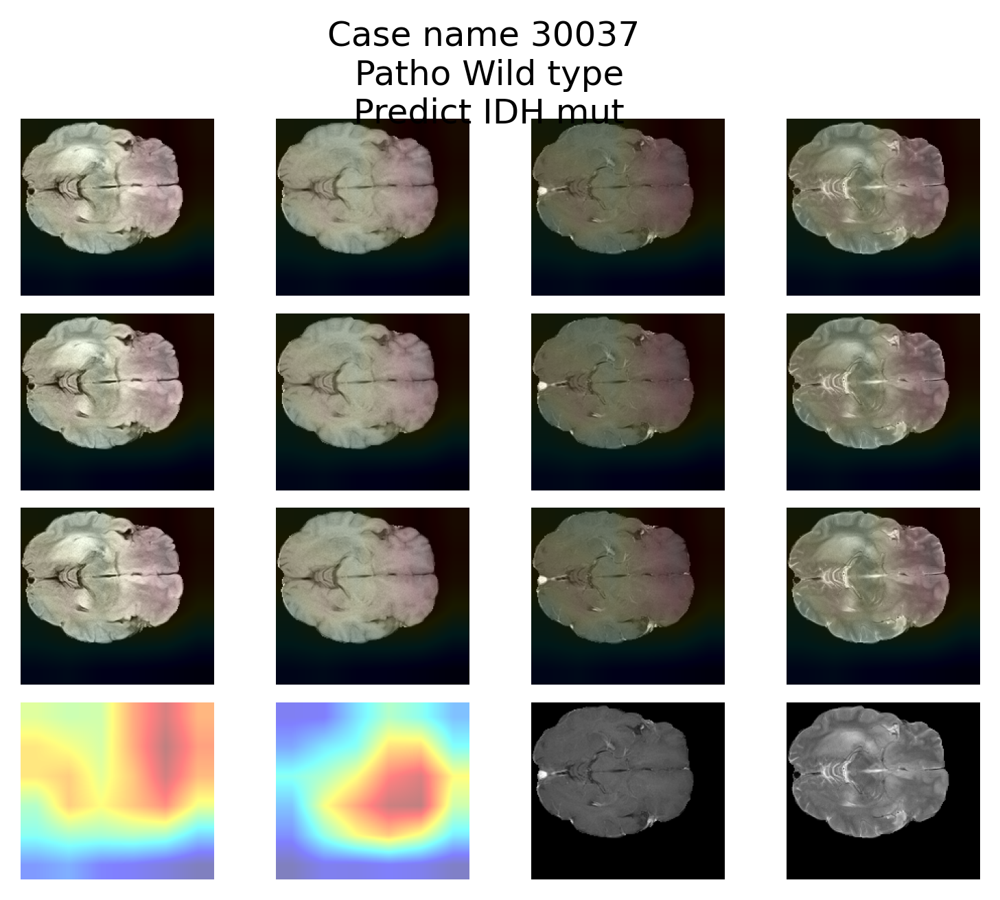

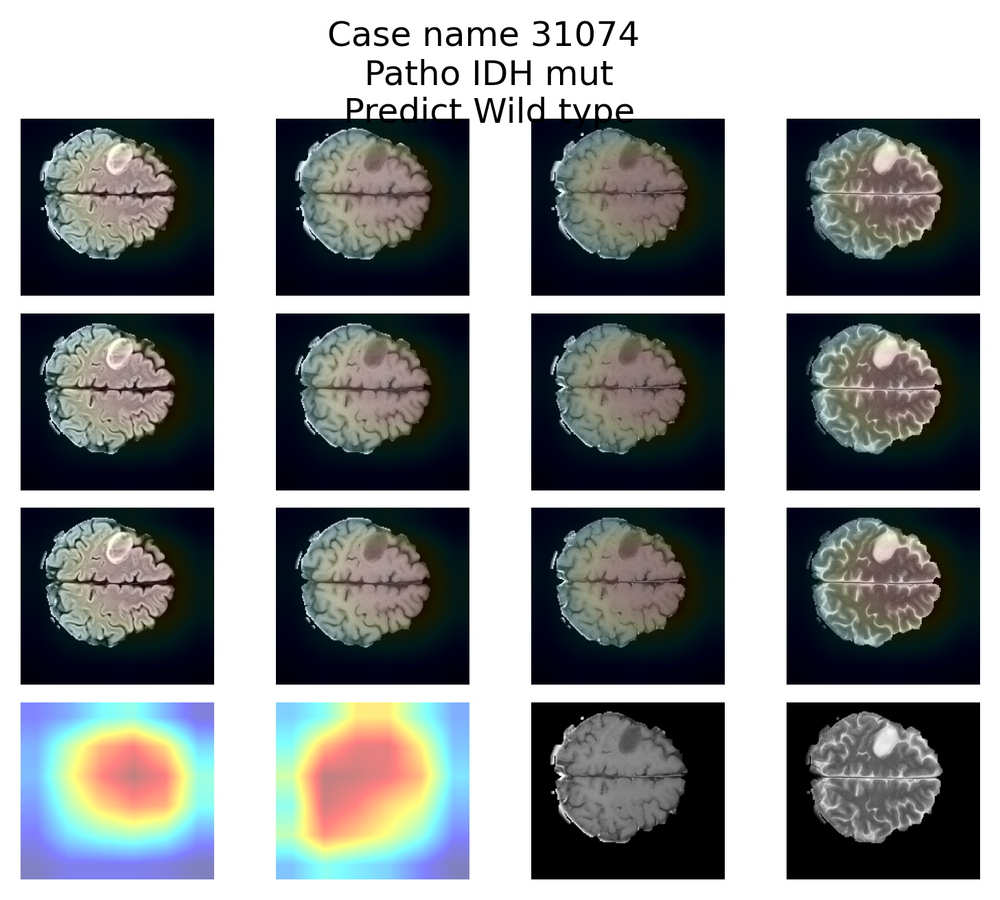

In [21]:
for n in [246,267,206,265]:
    label = JC_test_pd['Predicted_label_fold8'][n]
    true = int(JC_test[n][1][3])
    true_mask, fake_mask = get_heatmaps(model, target_layers, JC_test[n][0], label)
    T1CE_img = JC_test[n][0][2].to('cpu').detach().numpy().copy()
    T2_img = JC_test[n][0][3].to('cpu').detach().numpy().copy()
    fig = plt.figure(dpi=300)
    for i in range(12):
        img_numpy = JC_test[n][0][i].to('cpu').detach().numpy().copy()
        ax = fig.add_subplot(4,4,i+1)
        ax.imshow(img_numpy, cmap='gray')
        ax.imshow(true_mask, alpha=0.1)
        ax.axis('off')
        plt.subplots_adjust(
                        wspace=0, 
                        hspace=0.1)
    
    ax = fig.add_subplot(4,4,13)
    ax.imshow(true_mask, alpha=0.5)
    ax.axis('off')
    plt.subplots_adjust(wspace=0, 
                        hspace=0.1)
    
    ax = fig.add_subplot(4,4,14)
    ax.imshow(fake_mask, alpha=0.5)
    ax.axis('off')
    plt.subplots_adjust(wspace=0, 
                        hspace=0.1)
    
    ax = fig.add_subplot(4,4,15)
    ax.imshow(T1CE_img, cmap='gray')
    ax.axis('off')
    plt.subplots_adjust(wspace=0, 
                        hspace=0.1)
    
    ax = fig.add_subplot(4,4,16)
    ax.imshow(T2_img, cmap='gray')
    ax.axis('off')
    plt.subplots_adjust(wspace=0, 
                        hspace=0.1)
    fig.suptitle('Case name %s\n Patho %s\n Predict %s'
                 %(JC_test_pd['ID'][n], IDH_dict[true], IDH_dict[label]))

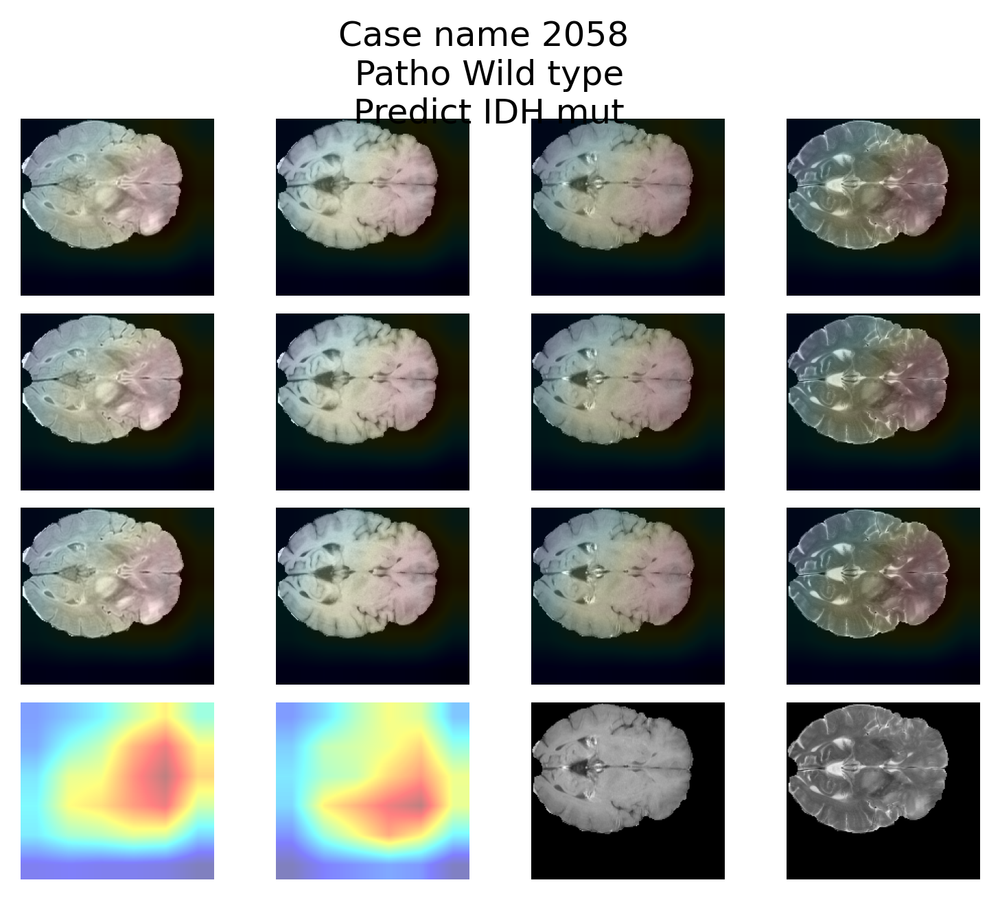

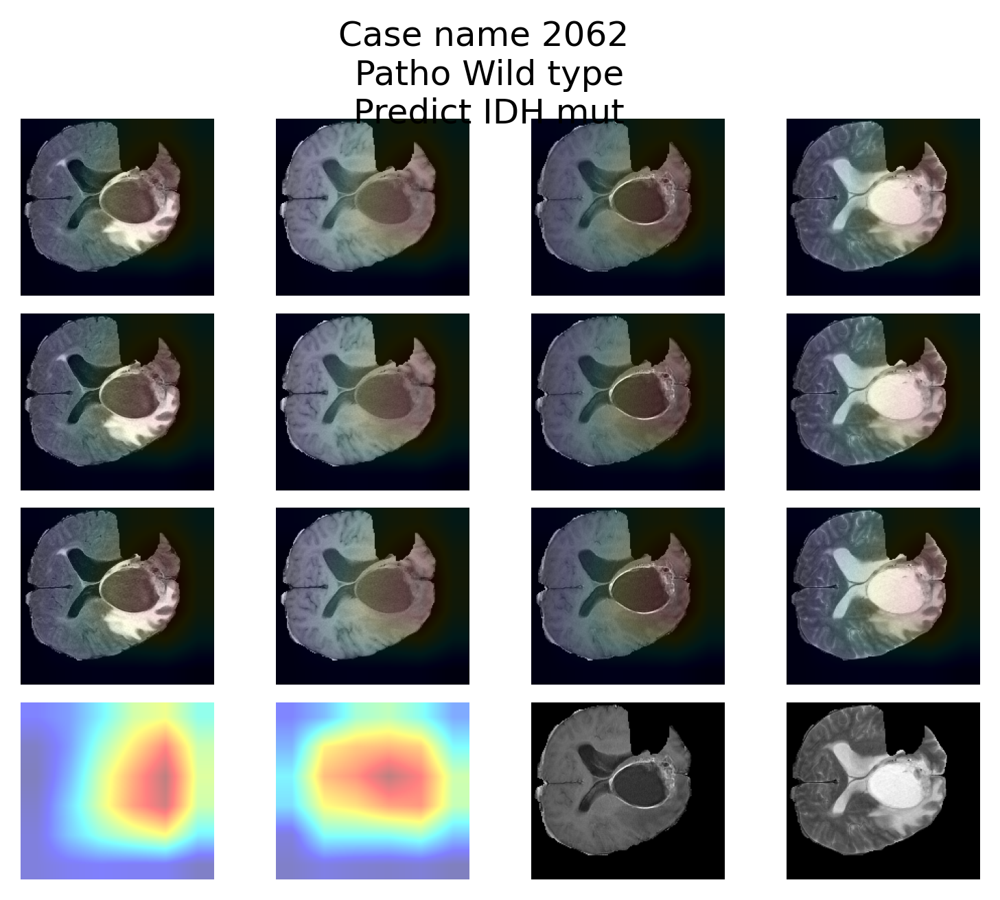

In [22]:
for n in [12,13]:
    label = JC_test_pd['Predicted_label_fold8'][n]
    true = int(JC_test[n][1][3])
    true_mask, fake_mask = get_heatmaps(model, target_layers, JC_test[n][0], label)
    T1CE_img = JC_test[n][0][2].to('cpu').detach().numpy().copy()
    T2_img = JC_test[n][0][3].to('cpu').detach().numpy().copy()
    fig = plt.figure(dpi=300)
    for i in range(12):
        img_numpy = JC_test[n][0][i].to('cpu').detach().numpy().copy()
        ax = fig.add_subplot(4,4,i+1)
        ax.imshow(img_numpy, cmap='gray')
        ax.imshow(true_mask, alpha=0.1)
        ax.axis('off')
        plt.subplots_adjust(
                        wspace=0, 
                        hspace=0.1)
    
    ax = fig.add_subplot(4,4,13)
    ax.imshow(true_mask, alpha=0.5)
    ax.axis('off')
    plt.subplots_adjust(wspace=0, 
                        hspace=0.1)
    
    ax = fig.add_subplot(4,4,14)
    ax.imshow(fake_mask, alpha=0.5)
    ax.axis('off')
    plt.subplots_adjust(wspace=0, 
                        hspace=0.1)
    
    ax = fig.add_subplot(4,4,15)
    ax.imshow(T1CE_img, cmap='gray')
    ax.axis('off')
    plt.subplots_adjust(wspace=0, 
                        hspace=0.1)
    
    ax = fig.add_subplot(4,4,16)
    ax.imshow(T2_img, cmap='gray')
    ax.axis('off')
    plt.subplots_adjust(wspace=0, 
                        hspace=0.1)
    fig.suptitle('Case name %s\n Patho %s\n Predict %s'
                 %(JC_test_pd['ID'][n], IDH_dict[true], IDH_dict[label]))